In [16]:
# Importing Necessary Libraries
import os  # For interacting with the operating system
import h5py  # For working with HDF5 files (storing large datasets)
import numpy as np  # Numerical computing library for handling arrays and mathematical operations
import matplotlib.pyplot as plt  # Plotting and visualization library
import torch  # PyTorch framework for deep learning and tensor operations
import pandas as pd  # Data manipulation and analysis library
from collections import Counter  # Utility for counting hashable items
from joblib import dump, load  # For saving and loading machine learning models efficiently
import pickle # passing data between files
from torch.utils.data import DataLoader
import multiprocessing

# SSL Legacy Survey-specific utilities
from ssl_legacysurvey.utils import load_data  # Loads galaxy catalogue and image data from HDF5 files
from ssl_legacysurvey.utils import plotting_tools as plt_tools  # Utilities for plotting images and catalogue information
from ssl_legacysurvey.data_loaders import datamodules  # PyTorch DataLoaders and DataModules for managing datasets
from ssl_legacysurvey.data_loaders import decals_augmentations  # Augmentation techniques for training deep learning models
from ssl_legacysurvey.data_analysis import dimensionality_reduction  # Implements PCA, UMAP, and other dimensionality reduction techniques

# Modules for self-supervised learning
import torchvision  # Image processing and model utilities for PyTorch
import pytorch_lightning as pl  # High-level framework for organizing PyTorch training loops
import argparse  # Handles command-line argument parsing
import logging  # Logging module for tracking events during execution
from pathlib import Path  # Object-oriented file system paths
import sys  # Provides system-specific parameters and functions
import glob  # File pattern matching and retrieval
import math  # Mathematical operations and constants

# PyTorch Lightning utilities for training and distributed computing
from pytorch_lightning import loggers as pl_loggers  # Logging utilities for tracking experiments
from pytorch_lightning.plugins import DDPPlugin  # Distributed Data Parallel (DDP) plugin for multi-GPU training

# Self-Supervised Learning (SSL) Model
from ssl_legacysurvey.moco.moco2_module import Moco_v2  # MoCo v2 self-supervised learning module

# Additional SSL utilities
from ssl_legacysurvey.utils import format_logger  # Formatting utility for logging
from scripts import predict  # Prediction script for trained models
from ssl_legacysurvey.finetune import extract_model_outputs  # Extracts model outputs for downstream tasks
from scripts import similarity_search_nxn  # Implements NxN similarity search for feature comparison

# Dimensionality Reduction
from umap import UMAP  # Uniform Manifold Approximation and Projection (UMAP) for visualization and clustering

# Building the k-NN Model
from sklearn.neighbors import KNeighborsClassifier  # k-Nearest Neighbors (k-NN) classification algorithm
from sklearn.pipeline import Pipeline  # For creating machine learning pipelines
from sklearn.preprocessing import StandardScaler  # Standardization of features (scaling)
from sklearn.model_selection import train_test_split, KFold, cross_val_score, LeaveOneOut  # Data splitting and cross-validation techniques
from sklearn.compose import ColumnTransformer  # Preprocessing pipeline for different feature types
from sklearn.impute import SimpleImputer  # Handling missing values in datasets
from sklearn.model_selection import GridSearchCV  # Allows for hyperparameter tuning

# k-NN Model Evaluation
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay  # Confusion matrix visualization
from sklearn.metrics import accuracy_score  # Calculates classification accuracy
from sklearn.metrics import classification_report  # Generates detailed classification performance metrics
import pickle

ModuleNotFoundError: No module named 'finetune'

In [4]:
#data_path = '/pscratch/sd/j/jlargett/DESI_SGA_MINE/Sorter/h5py-files/SGA-152by152-Cutouts-TFY1.h5'
data_path = '/pscratch/sd/q/qshimp/h5py-files/SGA-152by152-Cutouts-TFY1.h5'

### Loading Past Iterations <br>
Code below for one iteration, repeat for others.

In [ ]:
# Load Iteration 1
with open("/pscratch/sd/j/jlargett/DESI_SGA_MINE/Sorter/binary_results/fpy3_it1.pkl", "rb") as f:
    classified_sga_ids_it1 = pickle.load(f)

In [ ]:
# Extract all classes per iteration
spirals_it1 = set(classified_sga_ids_it1["spiral"])
ellipticals_it1 = set(classified_sga_ids_it1["elliptical"])
lenticulars_it1 = set(classified_sga_ids_it1["lenticular"])
irregulars_it1 = set(classified_sga_ids_it1["irregular"])
no_class_it1 = set(classified_sga_ids_it1["no_classification"])

# sll-legacysurvey

In [5]:
# Define matplotlib defaults
plt.rcParams['figure.figsize']        = 8., 6.
plt.rcParams['axes.labelsize']        = 18
plt.rcParams['axes.titlesize']        = 18
plt.rcParams['xtick.top']             = True
plt.rcParams['xtick.bottom']          = True
plt.rcParams['ytick.left']            = True
plt.rcParams['ytick.right']           = True
plt.rcParams['xtick.direction']       = 'in'
plt.rcParams['ytick.direction']       = 'in'
plt.rcParams['xtick.labelsize']       = 18
plt.rcParams['ytick.labelsize']       = 18
plt.rcParams['xtick.major.pad']       = 6.
plt.rcParams['xtick.minor.pad']       = 6.
plt.rcParams['ytick.major.pad']       = 6.
plt.rcParams['ytick.minor.pad']       = 6.
plt.rcParams['xtick.major.size']      = 6. # major tick size in points
plt.rcParams['xtick.minor.size']      = 3. # minor tick size in points
plt.rcParams['ytick.major.size']      = 6. # major tick size in points
plt.rcParams['ytick.minor.size']      = 3. # minor tick size in points
plt.rcParams['text.usetex']           = False
plt.rcParams['font.family']           = 'serif'
plt.rcParams['font.size']             = 18

In [6]:
# Load h5py file into dictionary
DDL = load_data.DecalsDataLoader(image_dir=data_path, npix_in=152)
gals = DDL.get_data(-1, fields=DDL.fields_available,npix_out=152) # -1 to load all galaxies

print("Available keys & data shapes:")
for k in gals:
    print(f"{k} shape:", gals[k].shape)

Available keys & data shapes:
inds shape: (10278,)
Main_Type shape: (10278,)
SGA_ID shape: (10278,)
cutout_type shape: (10278,)
dec shape: (10278,)
images shape: (10278, 3, 152, 152)
mag_g shape: (10278,)
mag_r shape: (10278,)
mag_z shape: (10278,)
morphology shape: (10278,)
ra shape: (10278,)
umap_region shape: (10278,)


* You have an image of a galaxy.
* Apply augmentations creating two views of the same image. These two views form a positive pair (ie. they come from the same image)
* Pass boh through the model.
* View 1 (query) goes through the encoder_q (resnet50), projection head (MLP), and outputs query vector q (128-dim)
* View 2 (key) goes through the encoder_k (momentum encoder, slowly updated copy of encoder_q), projection head (MLP), and outputs positive key vector k + (128-dim)
* Compute contrastive loss (ie we want q to be close to its matching k+ and far from the negative samples, k-, pulled from the memory queue (ie. previous k+ vectors from earlier batches)
* Update.
* Do this for all galaxies.

In [7]:
class Args: # In general codes in this project use argparse. Args() simplifies this for this example 
    
    # Data location and GPU availability
    gpu = True # Use GPU?
    gpus = 1 # Number of gpus to use
    num_nodes = 1
    ngals_tot = gals['images'].shape[0]
    
    # Training
    verbose = True
    ssl_training = True
    batch_size = ngals_tot
    learning_rate = 0.03
    max_epochs = 1
    max_num_samples= ngals_tot
    
    
    check_val_every_n_epoch = 999 # We haven't provided validation set, so don't use it! (set to a high number since not used)
    num_sanity_val_steps = 0 # number of validation steps before starting training

    augmentations = 'grrrssgbjcgnrg'
    jitter_lim = 7
    
    strategy = 'dp' # Distributed training strategy, ddp does not work in ipython notebook, only dp (distributed parallel) does
    seed = 42 # Random seed for reproducibility.

    checkpoint_every_n_epochs = 1 # Frequency of saving model checkpoints
    num_workers = 1 # Number of workers for data loader

    # Model architecture and settings
    backbone = 'resnet50' # Encoder architecture to use, Can use any in torchvision, i.e. ['resnet18', 'resnet34', 'resnet50', 'resnet152', .....]
    use_mlp = True # use projection head

    emb_dim = 128 # Dimensionality where loss is calculated
    num_negatives = 16 #Number of negative samples to keep in queue for Mocov2
    
    # needed for predict.py script
    out_dir = 'diskdata/representations/' # Directory for saving representations.
    extract_representations = True # Whether to extract representations from the model.
    checkpoint_path = 'resnet50.ckpt'
    use_mlp_representation = True
    overwrite = True
    file_head = 'diskdata' # Prefix for file names
    chunksize= ngals_tot
    batch_size_per_gpu = int(gals['images'].shape[0]/4)
    num_gpus = 1
    data_dim = 2048
    predict_batch_size = ngals_tot
    representation_directory = 'diskdata/representations/'
    representation_file_head = file_head
    umap_file_head = 'umap_diskdata_representations'
    train_umap = True
    
    #For dimensionality reduction script
    n_samples = 1000
    sample_dimensionality = 100
    n_pca_components = 8
    n_umap_components = 2
    umap_embedding_file_path = os.path.join(out_dir, f"{umap_file_head}_{gals['images'].shape[0]}_embedding.npz")
    umap_transform_file_path = os.path.join(out_dir, f"{umap_file_head}_{gals['images'].shape[0]}_transform.pkl")

    #for similarity search:
    use_faiss = True # Whether to use FAISS for similarity search.
    use_gpu = True
    norm = True # Whether to normalize the data.
    
    rep_dir = 'diskdata/representations/compiled/'
    output_dir = 'diskdata/representations/similarity/'
    knearest = 25
    delta_mag = 20
    start_on_chunk = 0
    survey = 'south'
    rep_file_head = file_head
    decals_dir = '/global/cfs/projectdirs/cusp/LBL/decals_galaxy_survey/'
    chunksize_similarity = ngals_tot
    sim_chunksize= ngals_tot
    rep_dim = 128
    nchunks = int(math.ceil(ngals_tot/chunksize))
    nchunks_similarity = int(math.ceil(ngals_tot/chunksize_similarity))
    supervised_training = True
    
params = vars(Args)
p = {}
for k, v in params.items():
    p[k] = v
params = p

In [12]:
# Loads the pretrained MoCo v2 model from .ckpt file
model = Moco_v2.load_from_checkpoint(
        checkpoint_path=params['checkpoint_path'])

In [13]:
# set the query encoder that was trained via contrastive learning as backbone
backbone = model.encoder_q

In [16]:
# removes the MLP projection head, so you only get the raw 2048-dim encoder outputs — these will be the feature embeddings
backbone.fc = torch.nn.Identity()

In [17]:
params['ssl_training'] = True
params['jitter_lim'] = 0
params['augmentations'] = 'rrjc'

In [19]:
# Setup dataset 
transform = datamodules.DecalsTransforms(params['augmentations'], params)
dataset = datamodules.DecalsDataset(data_path, None, transform, params)
ngals = len(dataset)
print(f"Number of selected galaxies: {ngals}")

Number of selected galaxies: 10278


In [ ]:
# define paths for saving and loading processed images
processed_images_path = '/pscratch/sd/j/jlargett/DESI_SGA_MINE/Sorter/Processed-Img-4-Sorter/Processed-Img-TFY1.pt'

In [ ]:
# load all images as one batch
transform = datamodules.DecalsTransforms(params['augmentations'], params)
decals_dataloader = datamodules.DecalsDataset(data_path, None, transform, params)

# determine number of images
ngals =  gals['images'].shape[0]
print(f"Number of selected galaxies: {ngals}")

# check if the processed images file already exists
if os.path.exists(processed_images_path):
    # load processed images from file
    images = torch.load(processed_images_path)
    print(f"Loaded processed images from {processed_images_path}")
else:
    # process and save images
    im, label = decals_dataloader.__getitem__(0)
    images = torch.empty((ngals, im.shape[0], im.shape[1], im.shape[2]), dtype=im.dtype)
    for i in range(ngals):
        images[i], _ = decals_dataloader.__getitem__(i)
        if i % 100 == 0:
            print('Processing', i)
            
    # save processed images to file
    torch.save(images, processed_images_path)
    print(f"Saved processed images to {processed_images_path}")

The first batch is like making a map of a town. Later batches are like placing new houses on that existing map.

In [23]:
ngals =  gals['images'].shape[0]
batch_size = 5000
batches = ngals // batch_size
data = []

# Move the model to GPU
backbone = backbone.cuda()

# Fit UMAP on the first batch
start_idx = 0
end_idx = batch_size

batch_images = images[start_idx:end_idx].cuda()
if not batch_images.is_contiguous():
    batch_images = batch_images.contiguous()
    
with torch.no_grad():
    batch_data = backbone(batch_images).detach().cpu()
data.append(batch_data)

# Save the embeddings
embeddings_path = 'diskdata/embeddings.pt'
torch.save(batch_data, embeddings_path)
print(f"Saved first batch embeddings to {embeddings_path}")

# Train UMAP on the first batch
embedding_model = UMAP(n_components=2, metric='cosine', random_state=42)
embedding_model.fit(batch_data)

# Transform subsequent batches and store UMAP embeddings
umap_embeddings = embedding_model.transform(batch_data)
for i in range(1, batches):
    start_idx = i * batch_size
    end_idx = (i + 1) * batch_size
    batch_images = images[start_idx:end_idx].cuda()  # Move batch to GPU
    with torch.no_grad():
        batch_data = backbone(batch_images).detach().cpu()
    data.append(batch_data)
    print(f"Processed batch {i+1}/{batches}")

    # Transform the current batch using the fitted UMAP model
    batch_umap_embeddings = embedding_model.transform(batch_data)
    umap_embeddings = np.vstack((umap_embeddings, batch_umap_embeddings))

# Process the remaining galaxies
remaining_start_idx = batches * batch_size
remaining_end_idx = ngals
if remaining_start_idx < remaining_end_idx:
    batch_images = images[remaining_start_idx:remaining_end_idx].cuda()  # Move remaining batch to GPU
    with torch.no_grad():
        batch_data = backbone(batch_images).detach().cpu()
    data.append(batch_data)
    print(f"Processed remaining batch from {remaining_start_idx} to {remaining_end_idx}")

    # Transform the remaining batch using the fitted UMAP model
    batch_umap_embeddings = embedding_model.transform(batch_data)
    umap_embeddings = np.vstack((umap_embeddings, batch_umap_embeddings))

# Convert the final list of embeddings into a single tensor
data = torch.cat(data)

# Save the final combined embeddings
final_embeddings_path = 'diskdata/final_embeddings.pt'
torch.save(data, final_embeddings_path)
print(f"Saved final combined embeddings to {final_embeddings_path}")

# Save the final UMAP embeddings
umap_embeddings_path = 'diskdata/umap_embeddings.pt'
torch.save(torch.tensor(umap_embeddings), umap_embeddings_path)
print(f"Saved UMAP embeddings to {umap_embeddings_path}")

Saved first batch embeddings to diskdata/embeddings.pt
Processed batch 2/2
Processed remaining batch from 10000 to 10278
Saved final combined embeddings to diskdata/final_embeddings.pt
Saved UMAP embeddings to diskdata/umap_embeddings.pt


# UMAP Visualizations

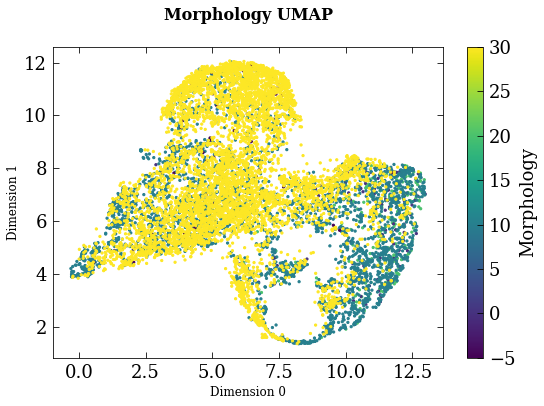

In [24]:
# Create the UMAP with a color bar
plt.figure(figsize=(8, 6))  # Adjust figure size for presentation
plt.scatter(umap_embeddings[:, 0], umap_embeddings[:, 1], s=5, c=gals['Main_Type'], cmap='viridis')
plt.colorbar(label='Morphology')
plt.xlabel('Dimension 0', fontsize=12)
plt.ylabel('Dimension 1', fontsize=12)

# Add the subtitle below the main title
plt.text(0.5, 1.10, 'Morphology UMAP', ha='center', va='center', fontsize=16, fontweight='bold', transform=plt.gca().transAxes)

# Adjust layout to make room for titles
plt.tight_layout()
plt.show()

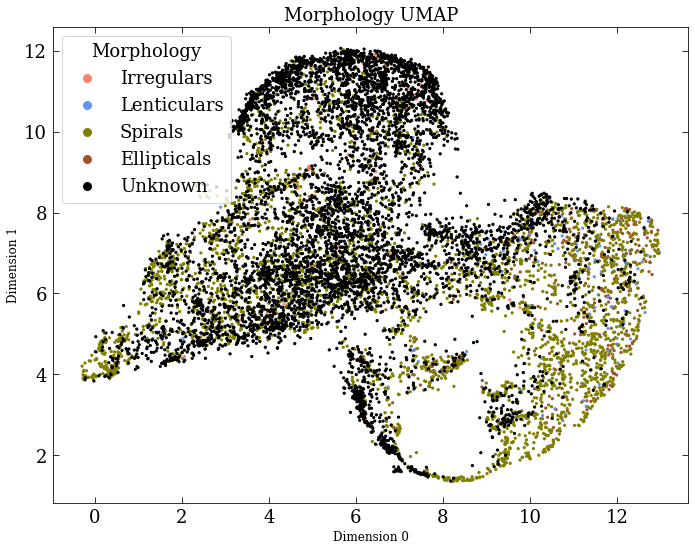

In [28]:
# Define a color map for morphological types
morphology_colors = {
    -5: 'salmon',       # Irregulars
    0: 'cornflowerblue',        # Lenticulars
    10: 'olive',      # Spirals
    20: 'sienna',      # Ellipticals
    30: 'black',     #unknown
}

# Assign colors to each point based on 'Main_Type'
colors = [morphology_colors[main_type] for main_type in gals['Main_Type']]

# Create the scatter plot
plt.figure(figsize=(10, 8))
scatter = plt.scatter(umap_embeddings[:, 0], umap_embeddings[:, 1], s=5, c=colors)

# Create a custom legend
legend_labels = {
    'Irregulars': 'salmon',
    'Lenticulars': 'cornflowerblue',
    'Spirals': 'olive',
    'Ellipticals': 'sienna',
    'Unknown': 'black',
}

# Add legend to the plot
legend_handles = [plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=color, markersize=10, label=label) 
                  for label, color in legend_labels.items()]
plt.legend(handles=legend_handles, title='Morphology', #bbox_to_anchor=(1.05, 1)
           loc='upper left')

# Add labels and titles
plt.xlabel('Dimension 0', fontsize=12)
plt.ylabel('Dimension 1', fontsize=12)
plt.title('Morphology UMAP')
plt.tight_layout()
plt.show()

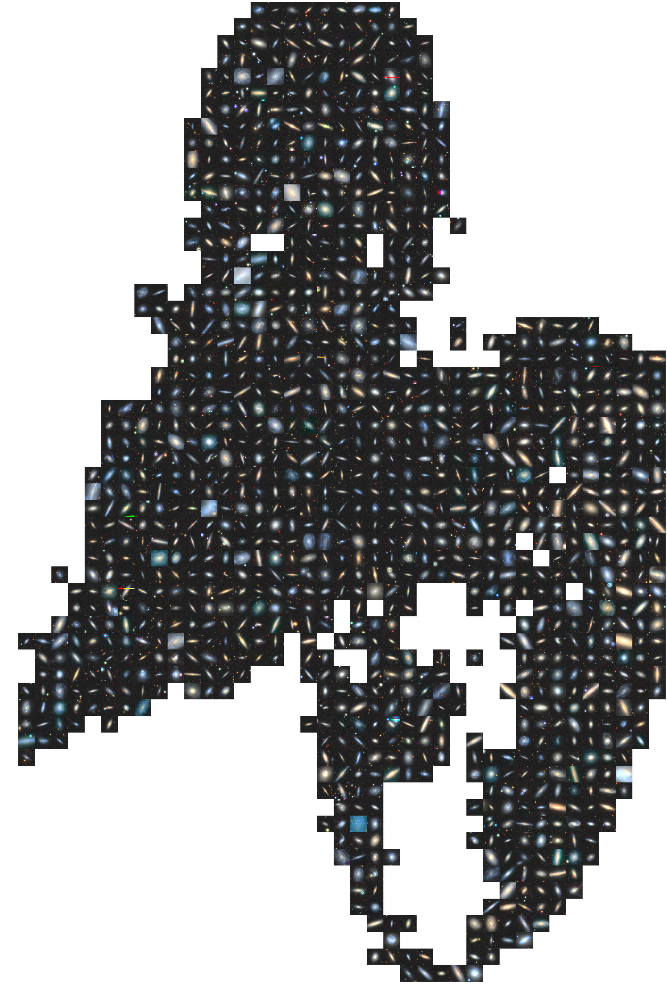

In [29]:
nx, ny = 40, 60
inds_use = np.arange(images.shape[0])
types_all = np.array(gals['Main_Type'])

img = plt_tools.scatter_plot_as_images(
    DDL,
    umap_embeddings,
    inds_use,
    nx=nx,
    ny=ny,
    npix_show=152,
)

ax = plt.gca()
ax.set_facecolor('none')
ax.patch.set_alpha(0)
plt.axis('off')
plt.tight_layout()
plt.show()

# knn classification

* __[KNeighborsClassifier - scikitlearn](https://scikit-learn.org/stable/modules/generated/sklearn.neighbors.KNeighborsClassifier.html)__
* **How it works:** Imagine you have a dataset with points scattered in a multi-dimensional space. Each point has a label or a value associated with it. The k-NN algorithm classifies new data points based on the majority class or average value of their nearest neighbors. 'k' is a parameter you choose upfront. It represents the number of nearest neighbors to consider when making predictions. To classify a new data point, the algorithm calculates the distance between the new point and every other point in the dataset. Once distances are calculated, the algorithm identifies the 'k' nearest neighbors (closest points) to the new data point. For classification, it counts how many neighbors belong to each class and assigns the new data point to the class that has the most representatives among its 'k' nearest neighbors.
* **Strengths:** Simple to implement, works well with large datasets, and is effective when the decision boundary is not too complex.
* **Weaknesses:** Sensitive to noisy data, computationally expensive with large datasets, and may struggle with high-dimensional data due to the curse of dimensionality.

In [54]:
# Define label mapping
label_mapping = {-5: 'Irregular', 0: 'Lenticular', 10: 'Spiral', 20: 'Elliptical'}
gals_series = pd.Series(gals['Main_Type'])

# Create DataFrame for convenience
df = pd.DataFrame({
    'Target_ID': gals['SGA_ID'],
    'UMAP_Coordinates': list(umap_embeddings),
    'Galaxy_Int-Type': gals_series
})
df

,Target_ID,UMAP_Coordinates,Galaxy_Int-Type
0,1046962.0,"[12.220423, 6.9901595]",20.0
1,649960.0,"[10.405315, 2.9352126]",20.0
2,809115.0,"[7.7113223, 4.0661616]",20.0
3,308186.0,"[8.124386, 4.438926]",20.0
4,23934.0,"[10.633033, 5.7442145]",20.0
...,...,...,...
10273,601060.0,"[8.120127, 4.2978506]",30.0
10274,600502.0,"[8.084142, 6.3531246]",30.0
10275,600377.0,"[5.6587086, 9.937552]",30.0
10276,603581.0,"[6.818728, 11.898693]",30.0


In [55]:
# Split the data into known types and unknown types
known_df = df[df['Galaxy_Int-Type'] != 30]
unknown_df = df[df['Galaxy_Int-Type'] == 30]

In [56]:
# Show Training Sample - galaxies with known morhologies or anchor points
known_df = known_df.sample(frac=1, random_state=42).reset_index(drop=True)
known_df

,Target_ID,UMAP_Coordinates,Galaxy_Int-Type
0,18900.0,"[1.6533265, 6.9601564]",10.0
1,724191.0,"[8.343193, 4.2137346]",20.0
2,90371.0,"[8.144766, 6.245646]",10.0
3,1011481.0,"[0.1067308, 4.727533]",10.0
4,739894.0,"[0.44657904, 4.553293]",10.0
...,...,...,...
4047,1231532.0,"[8.926329, 6.527906]",10.0
4048,849026.0,"[3.4529214, 6.3128467]",10.0
4049,641112.0,"[12.524043, 7.8996077]",10.0
4050,1000010.0,"[4.7756844, 7.6645894]",10.0


In [57]:
print("Count of Galaxy_Int-Type in known_df:")
print(known_df['Galaxy_Int-Type'].value_counts().sort_index())

Count of Galaxy_Int-Type in known_df:
-5.0       82
 0.0      117
 10.0    3526
 20.0     327
Name: Galaxy_Int-Type, dtype: int64


In [58]:
# Show Test Sample - galaxies to classify
unknown_df

,Target_ID,UMAP_Coordinates,Galaxy_Int-Type
3970,1380804.0,"[6.026489, 12.000359]",30.0
3971,1225659.0,"[5.080321, 11.348755]",30.0
3972,573881.0,"[6.610336, 11.3976965]",30.0
3973,1025995.0,"[6.0921454, 3.428296]",30.0
3974,849342.0,"[5.2776423, 7.9550366]",30.0
...,...,...,...
10273,601060.0,"[8.120127, 4.2978506]",30.0
10274,600502.0,"[8.084142, 6.3531246]",30.0
10275,600377.0,"[5.6587086, 9.937552]",30.0
10276,603581.0,"[6.818728, 11.898693]",30.0


In [59]:
# Create Binary Training Sample DataFrame
known_df['Galaxy_Int-Type'] = known_df['Galaxy_Int-Type'].apply(lambda x: 1 if x == -5 else 0)

# Create Binary Test Sample DataFrame
unknown_df['Galaxy_Int-Type'] = unknown_df['Galaxy_Int-Type'].apply(lambda x: 1 if x == -5 else 0)

/tmp/ipykernel_2093628/2368271037.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  unknown_df['Galaxy_Int-Type'] = unknown_df['Galaxy_Int-Type'].apply(lambda x: 1 if x == -5 else 0)


In [60]:
print("Count of Galaxy_Int-Type in known_df:")
print(known_df['Galaxy_Int-Type'].value_counts().sort_index())
print("Count of Galaxy_Int-Type in unknown_df:")
print(unknown_df['Galaxy_Int-Type'].value_counts().sort_index())

Count of Galaxy_Int-Type in known_df:
0    3970
1      82
Name: Galaxy_Int-Type, dtype: int64
Count of Galaxy_Int-Type in unknown_df:
0    6226
Name: Galaxy_Int-Type, dtype: int64


In [61]:
# Prepare features and labels
X_train = np.array(known_df['UMAP_Coordinates'].tolist())
y_train = known_df['Galaxy_Int-Type'].values
X_test = np.array(unknown_df['UMAP_Coordinates'].tolist())
y_test = unknown_df['Galaxy_Int-Type'].values

In [62]:
print(f"X_train Number: {len(X_train)}, X_test Number: {len(X_test)}")
print(f"Y_train Number: {len(y_train)}, X_test Number: {len(y_test)}")

X_train Number: 4052, X_test Number: 6226
Y_train Number: 4052, X_test Number: 6226


In [63]:
# Define binary class colors
class_colors_binary = {
    1: 'green',  # Example: Spirals
    0: 'black'   # Example: Non-spirals
}

def visualize_large_training_set(y_train, class_colors, figsize=(15, 3)):
    fig, ax = plt.subplots(figsize=figsize)  # Large figure

    # Convert labels to integers and sort
    y_train = np.array(y_train, dtype=int)
    sorted_indices = np.argsort(y_train)
    y_train_sorted = y_train[sorted_indices]

    # Use sequential x-values for better spacing
    x_train = np.arange(len(y_train_sorted))

    # Scatter plot for training data
    scatter_train = ax.scatter(
        x_train, [3.5] * len(y_train_sorted), 
        c=[class_colors[c] for c in y_train_sorted], 
        marker="_", lw=50, label='Training Set'
    )

    # Create legend with class colors
    handles = [
        plt.Line2D([0], [0], marker='_', color=color, markersize=15, lw=10, label=f"{'1 (Binary Class)' if c==1 else '0 (Other)'}")
        for c, color in class_colors.items()
    ]

    ax.set_ylim([3, 4])
    ax.set_yticks([3.5])
    ax.set_yticklabels(["Training Set"])
    ax.set_xlabel("Number of Galaxies")
    plt.legend(handles=handles, title='Classes', bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.title("Binary Classification - Training Set (Sorted)")
    
    plt.show()

In [64]:
def visualize_large_test_set(y_test, class_colors, figsize=(15, 3)):
    fig, ax = plt.subplots(figsize=figsize)  # Large figure

    # Convert labels to integers and sort
    y_test = np.array(y_test, dtype=int)
    sorted_indices = np.argsort(y_test)
    y_test_sorted = y_test[sorted_indices]

    # Use sequential x-values for better spacing
    x_test = np.arange(len(y_test_sorted))

    # Scatter plot for test data
    scatter_test = ax.scatter(
        x_test, [3.5] * len(y_test_sorted), 
        c=[class_colors[c] for c in y_test_sorted], 
        marker="_", lw=50, label='Test Set'
    )

    # Create legend with class colors
    handles = [
        plt.Line2D([0], [0], marker='_', color=color, markersize=15, lw=10, label=f"{'1 (Binary Class)' if c==1 else '0 (Other)'}")
        for c, color in class_colors.items()
    ]

    ax.set_ylim([3, 4])
    ax.set_yticks([3.5])
    ax.set_yticklabels(["Test Set"])
    ax.set_xlabel("Number of Galaxies")
    plt.legend(handles=handles, title='Classes', bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.title("Binary Classification - Test Set (Sorted)")
    
    plt.show()

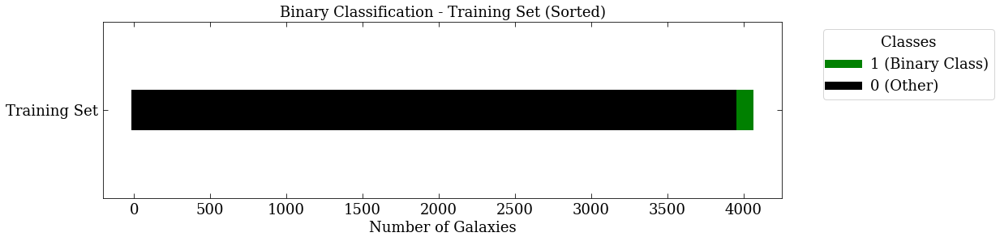

In [65]:
# Run the training set visualization
visualize_large_training_set(y_train, class_colors_binary, figsize=(15, 4))

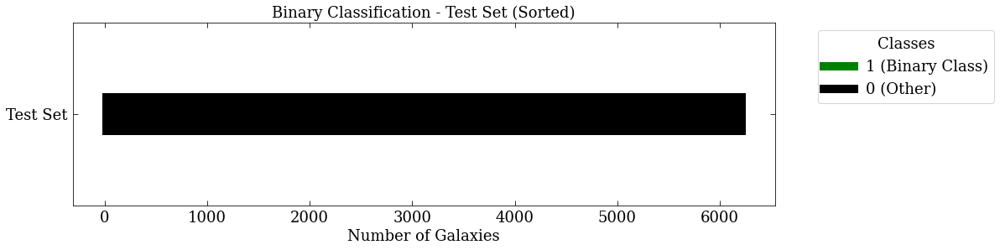

In [66]:
# Run the test set visualization
visualize_large_test_set(y_test, class_colors_binary, figsize=(15, 4))

In [67]:
# Define inverse squared weight function
def inverse_squared_distance(distances):
    # Avoid division by zero by setting distance = 1 for zero distances
    distances = np.clip(distances, a_min=1e-10, a_max=None)
    return 1 / (distances ** 2)

In [68]:
# Perform parameter tuning
param_grid = {
    'n_neighbors': [3, 5, 7, 10, 25, 50, 75, 90, 100],
    'weights': ['uniform', 'distance', inverse_squared_distance],
    'algorithm': ['ball_tree', 'kd_tree', 'brute'],
    'metric': ['minkowski', 'euclidean', 'manhattan', 'chebyshev', 'cosine'],
}
grid_search = GridSearchCV(KNeighborsClassifier(), param_grid, cv=5)
grid_search.fit(X_train, y_train)
best_knn = grid_search.best_estimator_

/global/homes/j/jlargett/miniforge3/envs/ssl-pl/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:372: FitFailedWarning: 
270 fits failed out of a total of 2025.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
135 fits failed with the following error:
Traceback (most recent call last):
  File "/global/homes/j/jlargett/miniforge3/envs/ssl-pl/lib/python3.9/site-packages/sklearn/model_selection/_validation.py", line 680, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/global/homes/j/jlargett/miniforge3/envs/ssl-pl/lib/python3.9/site-packages/sklearn/neighbors/_classification.py", line 198, in fit
    return self._fit(X, y)
  File "/global/homes/j/jlargett/miniforge3/envs/ssl-pl/lib/python3.9/sit

In [69]:
# Print the best parameters and best estimator
print("Best Parameters:")
print(grid_search.best_params_)
print("\nBest Estimator:")
print(best_knn)

Best Parameters:
{'algorithm': 'ball_tree', 'metric': 'minkowski', 'n_neighbors': 10, 'weights': 'uniform'}

Best Estimator:
KNeighborsClassifier(algorithm='ball_tree', n_neighbors=10)


In [70]:
# Create Pipeline adding Standard Scaling
pipeline = Pipeline([('scaler', StandardScaler()), ('knn', best_knn)])

# Fit the pipeline on the training data
pipeline.fit(X_train, y_train)

Pipeline(steps=[('scaler', StandardScaler()),
                ('knn',
                 KNeighborsClassifier(algorithm='ball_tree', n_neighbors=10))])

In [71]:
# Define k-Fold cross-validation
kf = KFold(n_splits=5, shuffle=True, random_state=42)

# Perform cross-validation
scores = cross_val_score(pipeline, X_train, y_train, cv=kf, scoring='accuracy')

print(f'Cross-validation scores: {scores}')
print(f'Mean accuracy: {scores.mean()}')

Cross-validation scores: [0.98397041 0.97903822 0.98395062 0.97407407 0.97901235]
Mean accuracy: 0.9800091336712793


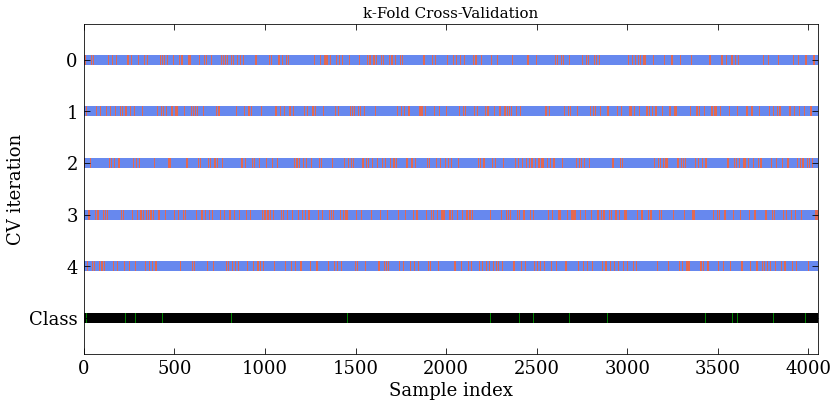

In [72]:
# Define the number of splits
n_splits = 5

def plot_cv_indices(cv, X, y, ax, n_splits, lw=10):
    # Generate the training/testing visualizations for each CV split
    for ii, (tr, tt) in enumerate(cv.split(X=X, y=y)):
        # Fill in indices with the training/test groups
        indices = np.array([np.nan] * len(X))
        indices[tt] = 1  # Testing indices
        indices[tr] = 0  # Training indices

        # Visualize the results
        ax.scatter(
            range(len(indices)),
            [ii + 0.5] * len(indices),
            c=indices,
            marker="_",
            lw=lw,
            cmap='coolwarm',  # Color map for train/test
            vmin=-0.2,
            vmax=1.2,
        )

    # Plot the data classes with specific colors
    colors = np.where(y == 1, 'green', 'black')  # Green for Binary Class, Black for Others
    ax.scatter(
        range(len(X)),
        [ii + 1.5] * len(X), 
        c=colors, marker="_", lw=lw
    )

    # Formatting
    yticklabels = list(range(n_splits)) + ["Class"]
    ax.set(
        yticks=np.arange(n_splits + 1) + 0.5,
        yticklabels=yticklabels,
        xlabel="Sample index",
        ylabel="CV iteration",
        ylim=[n_splits + 1.2, -0.2],
        xlim=[0, len(X)],
    )
    ax.set_title("k-Fold Cross-Validation", fontsize=15)
    return ax

# Define a k-Fold cross-validator for demonstration
kf = KFold(n_splits=n_splits, shuffle=True, random_state=42)

# Plotting the k-Fold cross-validation
fig, ax = plt.subplots(figsize=(12, 6))
plot_cv_indices(kf, X_train, y_train, ax, n_splits)
plt.tight_layout()
plt.show()

In [73]:
# MAKE THE CLASSIFCIATION!!!
y_pred_test = pipeline.predict(X_test)

/tmp/ipykernel_2093628/2542747820.py:7: RuntimeWarning: invalid value encountered in true_divide
  cm_binary = cm_binary.astype('float') / cm_binary.sum(axis=1)[:, np.newaxis]


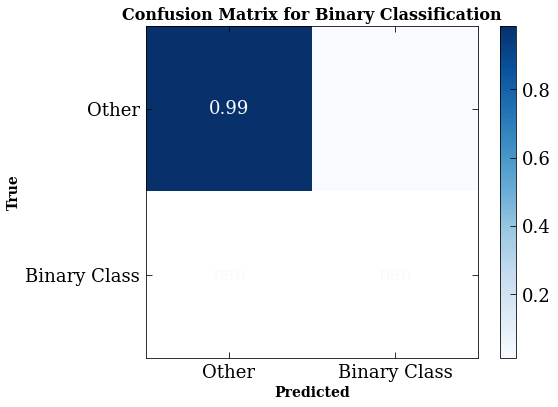

In [74]:
# Define binary class labels for binary classification (Ex: 1 for Spirals and 0 for Not Spirals)
binary_label_mapping = {0: 'Other', 1: 'Binary Class'}
display_labels_binary = [binary_label_mapping[i] for i in sorted(binary_label_mapping.keys())]

# Generate and plot the confusion matrix for binary classification
cm_binary = confusion_matrix(y_test, y_pred_test)
cm_binary = cm_binary.astype('float') / cm_binary.sum(axis=1)[:, np.newaxis]
disp_binary = ConfusionMatrixDisplay(confusion_matrix=cm_binary, display_labels=display_labels_binary)

# Create a larger figure to accommodate the labels
fig, ax = plt.subplots(figsize=(8, 6))
disp_binary.plot(cmap=plt.cm.Blues, ax=ax, values_format='.2f')

# Set titles and labels
plt.xlabel('Predicted', fontsize=14, weight='bold')
plt.ylabel('True', fontsize=14, weight='bold')
plt.title('Confusion Matrix for Binary Classification', fontsize=16, weight='bold')

# Adjust layout to prevent label overlap
plt.tight_layout()

# Show the plot
plt.show()

In [75]:
# Extract the galaxy ids from the set of test galxies
test_set_ids = unknown_df['Target_ID'].values

# Ensure that all the test galaxies were predicted on
if len(test_set_ids) != len(y_pred_test):
    raise ValueError("Mismatch between the number of test set SGA_IDs and the number of predictions.")

# Create the predictions DataFrame
df_test_predictions = pd.DataFrame({
    'Target_ID': test_set_ids,
    'Predicted_Label': y_pred_test
})

# Map 0 to "Other" and 1 to "Binary Class" (ex: spiral)
df_test_predictions['Predicted_Type'] = df_test_predictions['Predicted_Label'].apply(lambda x: 'Irregular' if x == 1 else 'Other')

# Display the Classifcations
print(df_test_predictions.head())

# Count the occurrences of the Binary Class and Not Classifed Galaxies
counts = df_test_predictions['Predicted_Type'].value_counts()
print(counts)

# Save the DataFrame to a CSV file
#df_test_predictions.to_csv('', index=False)

   Target_ID  Predicted_Label Predicted_Type
0  1380804.0                0          Other
1  1225659.0                0          Other
2   573881.0                0          Other
3  1025995.0                0          Other
4   849342.0                0          Other
Other        6134
Irregular      92
Name: Predicted_Type, dtype: int64


### Visualizing Iterations

In [ ]:
# Create DataFrame with Galaxies that were not classified
no_classification_df = df[df['Target_ID'].isin(no_class_it1)][['Target_ID', 'UMAP_Coordinates']]
# Display the Not Classified Galaxies DataFrame
no_classification_df
# Create DataFrame for Classified Spirals 
spiral_classification_df = df[df['Target_ID'].isin(spirals_it1)][['Target_ID', 'UMAP_Coordinates']]
# Display the Classified Spiral DataFrame
spiral_classification_df
# Create DataFrame for Classified Lenticulars
lenticular_classification_df = df[df['Target_ID'].isin(lenticulars_it1)][['Target_ID', 'UMAP_Coordinates']]
# Display DataFrame for Classified Lenticulars
lenticular_classification_df
# Create DataFrame for Classified Irregulars
irregular_classification_df = df[df['Target_ID'].isin(irregulars_it1)][['Target_ID', 'UMAP_Coordinates']]
# Display DataFrame for Classified Irregulars
irregular_classification_df
# Create DataFrame for Classified Ellipticals
elliptical_classification_df = df[df['Target_ID'].isin(ellipticals_it1)][['Target_ID', 'UMAP_Coordinates']]
# Display the DataFrame for Classified Ellipticals
elliptical_classification_df
# Extract UMAP coordinates to display not classifed galaxies
umap_coordinates = no_classification_df['UMAP_Coordinates'].tolist()

# Split the UMAP coordinates into two separate lists for x and y
umap_x = [coord[0] for coord in umap_coordinates]
umap_y = [coord[1] for coord in umap_coordinates]

# Create the plot
plt.figure(figsize=(10, 8))
plt.scatter(umap_x, umap_y, c='blue', marker='o', edgecolor='k', s=100)

# Add titles and labels
plt.title('UMAP Coordinates for Selected SGA IDs')
plt.xlabel('UMAP Dimension 1')
plt.ylabel('UMAP Dimension 2')

# Show the plot
plt.show()

In [ ]:
# Display Not Classified Galaxies on UMAP Plot

# Function to extract UMAP coordinates from a dataframe
def extract_umap_coordinates(df):
    coordinates = df['UMAP_Coordinates'].tolist()
    return [coord[0] for coord in coordinates], [coord[1] for coord in coordinates]

# Function to overlay highlighted points on the UMAP plot
def overlay_points(df, color, label):
    x_coords, y_coords = extract_umap_coordinates(df)
    plt.scatter(x_coords, y_coords, s=1, c=color, marker=',', edgecolor=color, linewidth=1.5, label=label)

# Define a color map for morphological types
morphology_colors = {
    -5: 'salmon',       # Irregulars
    0: 'cornflowerblue',  # Lenticulars
    10: 'olive',         # Spirals
    20: 'sienna',        # Ellipticals
    -999: 'none',          # Unknown
}

# Assign colors to each point based on 'Main_Type'
colors = [morphology_colors[main_type] for main_type in gals['Main_Type']]

# Create the base scatter plot for all galaxies
plt.figure(figsize=(10, 8))
scatter = plt.scatter(umap_embeddings[:, 0], umap_embeddings[:, 1], s=1, c=colors)

# Overlay the highlighted points using the function
overlay_points(no_classification_df, 'black', 'Not Classified')
overlay_points(irregular_classification_df, 'salmon', 'Irregulars')
overlay_points(spiral_classification_df, 'olive', 'Spirals')
overlay_points(lenticular_classification_df, 'cornflowerblue', 'Lenticulars')
overlay_points(elliptical_classification_df, 'sienna', 'Ellipticals')

# Create a custom legend
legend_labels = {
    'Irregulars': 'salmon',
    'Lenticulars': 'cornflowerblue',
    'Spirals': 'olive',
    'Ellipticals': 'sienna',
    'Not Classified': 'black'
}

# Add legend to the plot
legend_handles = [
    plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=color, markersize=10, label=label) 
    for label, color in legend_labels.items()
]
plt.legend(handles=legend_handles, title='Morphology', loc='upper left')

# Add labels and titles
plt.xlabel('Dimension 0', fontsize=12)
plt.ylabel('Dimension 1', fontsize=12)
plt.title("Post-classification Iteration 1")
plt.tight_layout()

# Show the plot
plt.show()